In [1]:
import os

import matplotlib.pylab as plt
import seaborn as sns
import numpy as np
import numpy.linalg as la
from scipy.sparse import csc_matrix, csr_matrix
from tqdm.auto import tqdm

from datasets import get_dataset
from .src.optimizers import Ig, Nesterov, ClippedIg, Sgd, Shuffling, ClippedShuffling
from .src.loss_functions import Quadratic
from .src.utils import get_trace, relative_round
%load_ext autoreload
%autoreload 2

import matplotlib
sns.set(style="whitegrid", font_scale=1.2, context="talk", palette=sns.color_palette("bright"), color_codes=False)
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
matplotlib.rcParams['figure.figsize'] = (8, 6)

In [40]:
# %%html
# <style>
# .cell-output-ipywidget-background {
#    background-color: transparent !important;
# }
# .jp-OutputArea-output {
#    background-color: transparent;
# }  
# .jupyter-widgets {color: #d5d5d5 !important;}
# .widget-label {color: #d5d5d5 !important;}
# </style>

# Functions spread on the edges of interval

In [2]:
dataset = 'quadratic_noised'
# x = np.append(np.arange(0, 501), np.arange(1e5 - 500, 1e5 + 1))
np.random.seed(0)
if dataset == 'quadratic':
    x = np.append(np.random.randint(0, 501, 500), 
                  np.random.randint(1e5 - 500, 1e5 + 1, 500))
elif dataset == 'quadratic_noised':
    n_left_functions = 300
    var = 3
    x = np.append(
        np.random.randint(0, 501, n_left_functions) + np.random.normal(0, var, size=n_left_functions), 
        np.random.randint(1e5 - 500, 1e5 + 1, 1000 - n_left_functions) + \
            np.random.normal(0, var, size=1000 - n_left_functions))
loss = Quadratic(x)
f_opt = loss.f_opt
x_opt = loss.x_opt
n, dim = len(x), 1
L = loss.smoothness()
# x0 = np.array([3 * 1e4])
x0 = np.array([x_opt])
n_epochs = 20000
batch_size = 32
# n_seeds = 2 # was set to 20 in the paper
n_seeds = 10
stoch_it = n_epochs * n // batch_size
trace_len = 300

if x0 == x_opt:
    trace_path = f'results/{dataset}/x0_x_opt/bs_{batch_size}/'
    plot_path = f'plots/{dataset}/x0_x_opt/bs_{batch_size}'
else:
    trace_path = f'results/{dataset}/x0_{x0[0]}/bs_{batch_size}/'
    plot_path = f'plots/{dataset}/x0_{x0[0]}/bs_{batch_size}'
if not os.path.exists(trace_path):
    os.makedirs(trace_path)

step_size_list = np.logspace(-5, -1, 5)
# clip_level_list = np.logspace(-3, 3, 7)
clip_level_list = np.logspace(0, 5, 6)
print('step sizes:', step_size_list)
print('clip levels:', clip_level_list)
print('trace path:', trace_path)
print('plot path:', plot_path)

step sizes: [1.e-05 1.e-04 1.e-03 1.e-02 1.e-01]
clip levels: [1.e+00 1.e+01 1.e+02 1.e+03 1.e+04 1.e+05]
trace path: results/quadratic_noised/x0_x_opt/bs_32/
plot path: plots/quadratic_noised/x0_x_opt/bs_32


In [44]:
f_opt, x_opt

(2079384375147.0093, 69896.37714080737)

In [45]:
def best_trace_by_step_size(traces, step_size_list):
    min_i, min_val = 0, np.inf
    for i, tr in enumerate(traces):
        if tr.loss_vals is None:
            mean_loss_val = 0
            for loss_vals in tr.loss_vals_all.values():
                mean_loss_val += np.mean(loss_vals)
            mean_loss_val /= len(tr.loss_vals_all)
        else:
            mean_loss_val = np.mean(tr.loss_vals)
        if mean_loss_val < min_val:
            min_val = mean_loss_val
            min_i = i
    
    best_trace = traces[min_i]
    best_trace.step_size = step_size_list[min_i]
    return best_trace

## Experiments

### SGD

In [47]:
sgd_trace = get_trace(f'{trace_path}sgd_{n_epochs}', loss)
if not sgd_trace:
    sgd_traces = []
    for step_size in tqdm(step_size_list):
        lr0 = step_size
        sgd = Sgd(
            loss=loss,
            lr0=lr0, 
            it_max=stoch_it, 
            n_seeds=n_seeds, 
            batch_size=batch_size, 
            avoid_cache_miss=True, 
            trace_len=trace_len
        )
        sgd_trace = sgd.run(x0=x0)
        sgd_trace.convert_its_to_epochs(batch_size=batch_size)
        sgd_trace.compute_loss_of_iterates()
        sgd_traces.append(sgd_trace)
    sgd_trace = best_trace_by_step_size(sgd_traces, step_size_list)
print(f'best step size: {sgd_trace.step_size}')

best step size: 1e-05


In [48]:
sgd_trace.save(f'sgd_{n_epochs}', trace_path)

### Deterministic reshuffling

#### No clipping

In [49]:
ig_trace = get_trace(f'{trace_path}ig_{n_epochs}', loss)
if not ig_trace:
    ig_traces = []
    for step_size in tqdm(step_size_list):
        lr0 = step_size
        ig = Ig(
            loss=loss, 
            lr0=lr0, 
            it_max=stoch_it, 
            batch_size=batch_size, 
            trace_len=trace_len
        )
        ig_trace = ig.run(x0=x0)
        ig_trace.convert_its_to_epochs(batch_size=batch_size)
        ig_trace.compute_loss_of_iterates()
        ig_traces.append(ig_trace)
    ig_trace = best_trace_by_step_size(ig_traces, step_size_list)
print(f'best step size: {ig_trace.step_size}')

best step size: 1e-05


In [50]:
ig_trace.save(f'ig_{n_epochs}', trace_path)

#### With clipping

In [51]:
trace_path

'results/quadratic_noised/x0_x_opt/bs_32/'

In [52]:
f'{trace_path}c_{clip_level}_ig_{n_epochs}'

'results/quadratic_noised/x0_x_opt/bs_32/c_100000.0_ig_20000'

In [53]:
cig_traces = []
for clip_level in tqdm(clip_level_list):
    cig_trace = get_trace(f'{trace_path}c_{clip_level}_ig_{n_epochs}', loss)
    if not cig_trace:
        cl_cig_traces = []
        for step_size in step_size_list:
            lr0 = step_size
            cig = ClippedIg(
                clip_level,
                loss=loss, 
                lr0=lr0, 
                it_max=stoch_it, 
                batch_size=batch_size, 
                trace_len=trace_len
            )
            cig_trace = cig.run(x0=x0)
            cig_trace.convert_its_to_epochs(batch_size=batch_size)
            cig_trace.compute_loss_of_iterates()
            cl_cig_traces.append(cig_trace)

        cig_trace = best_trace_by_step_size(cl_cig_traces, step_size_list)
        cig_traces.append(cig_trace)
    else:
        cig_traces.append(cig_trace)
for cl, trace in zip(clip_level_list, cig_traces):
    print(f'best step size: {cig_trace.step_size}')

  0%|          | 0/6 [00:00<?, ?it/s]

best step size: 1e-05
best step size: 1e-05
best step size: 1e-05
best step size: 1e-05
best step size: 1e-05
best step size: 1e-05


In [54]:
for clip_level, cig_trace in zip(clip_level_list, cig_traces):
    cig_trace.save(f'c_{clip_level}_ig_{n_epochs}', trace_path)

#### With clipping OPT

In [55]:
cig_opt_traces = []
for clip_level in tqdm(clip_level_list):
    cig_opt_trace = get_trace(f'{trace_path}c_{clip_level}_ig_opt_{n_epochs}', loss)
    if not cig_opt_trace:
        cl_cig_opt_traces = []
        for step_size in step_size_list:
            lr0 = step_size
            cig_opt = ClippedIg(
                clip_level,
                loss=loss, 
                lr0=lr0, 
                it_max=stoch_it, 
                batch_size=batch_size, 
                trace_len=trace_len,
                x_opt=x_opt
            )
            cig_opt_trace = cig_opt.run(x0=x0)
            cig_opt_trace.convert_its_to_epochs(batch_size=batch_size)
            cig_opt_trace.compute_loss_of_iterates()
            cl_cig_opt_traces.append(cig_opt_trace)

        cig_opt_trace = best_trace_by_step_size(cl_cig_opt_traces, step_size_list)
        cig_opt_traces.append(cig_opt_trace)
    else:
        cig_opt_traces.append(cig_opt_trace)
for cl, trace in zip(clip_level_list, cig_opt_traces):
    print(f'best step size: {cig_opt_trace.step_size}')

  0%|          | 0/6 [00:00<?, ?it/s]

best step size: 1e-05
best step size: 1e-05
best step size: 1e-05
best step size: 1e-05
best step size: 1e-05
best step size: 1e-05


In [56]:
for clip_level, cig_opt_trace in zip(clip_level_list, cig_opt_traces):
    cig_opt_trace.save(f'c_{clip_level}_ig_opt_{n_epochs}', trace_path)

## Gradients

In [57]:
for cl, cig_trace, cig_opt_trace in zip(clip_level_list, cig_traces, cig_opt_traces):
    if cl == 1000:
        print('cig_trace', '\n', cig_trace.grad_estimators)
        print('cig_opt_trace', '\n', cig_opt_trace.grad_estimators)

cig_trace 
 [1000.0, 1000.0, 1000.0, 1000.0, 999.9999999999999, 1000.0, 1000.0000000000001, 1000.0, 1000.0, 1000.0, 1000.0, 1000.0, 999.9999999999999, 1000.0, 1000.0, 1000.0, 1000.0000000000001, 1000.0, 999.9999999999999, 1000.0000000000001, 999.9999999999999, 1000.0, 1000.0000000000001, 1000.0, 1000.0, 1000.0, 999.9999999999999, 999.9999999999999, 1000.0, 1000.0, 1000.0, 1000.0, 1000.0, 1000.0, 1000.0, 1000.0000000000001, 1000.0, 1000.0, 1000.0000000000001, 1000.0, 1000.0000000000001, 1000.0, 1000.0, 1000.0, 1000.0000000000001, 1000.0000000000001, 1000.0, 999.9999999999999, 999.9999999999999, 1000.0000000000001, 1000.0, 1000.0, 999.9999999999999, 999.9999999999999, 1000.0, 999.9999999999999, 1000.0, 999.9999999999999, 1000.0, 999.9999999999999, 1000.0, 1000.0, 1000.0, 1000.0, 1000.0, 1000.0, 1000.0, 1000.0, 1000.0000000000001, 999.9999999999999, 1000.0, 1000.0000000000001, 1000.0, 1000.0, 1000.0, 1000.0, 1000.0, 999.9999999999999, 1000.0000000000001, 1000.0, 1000.0, 1000.0000000000001

## Plots

In [58]:
ncols = 2 if len(clip_level_list) >= 2 else 1
nrows = int(np.ceil(len(clip_level_list) / 2))
fig_x = 18
fig_y = 28

### Everything with CRR without shifts

#### Functional residual

In [59]:
trace_path, plot_path

('results/quadratic_noised/x0_x_opt/bs_32/',
 'plots/quadratic_noised/x0_x_opt/bs_32')

In [60]:
if not os.path.exists(plot_path):
    os.makedirs(plot_path)

/Users/postrou/Documents/mbzuai/clipped_random_reshuffling/opt_trace.py:164: RuntimeWarning: divide by zero encountered in log
  y_log = [np.log(loss_vals-f_opt) for loss_vals in self.loss_vals_all.values()]
/Users/postrou/miniconda3/envs/crr/lib/python3.11/site-packages/numpy/core/_methods.py:173: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)


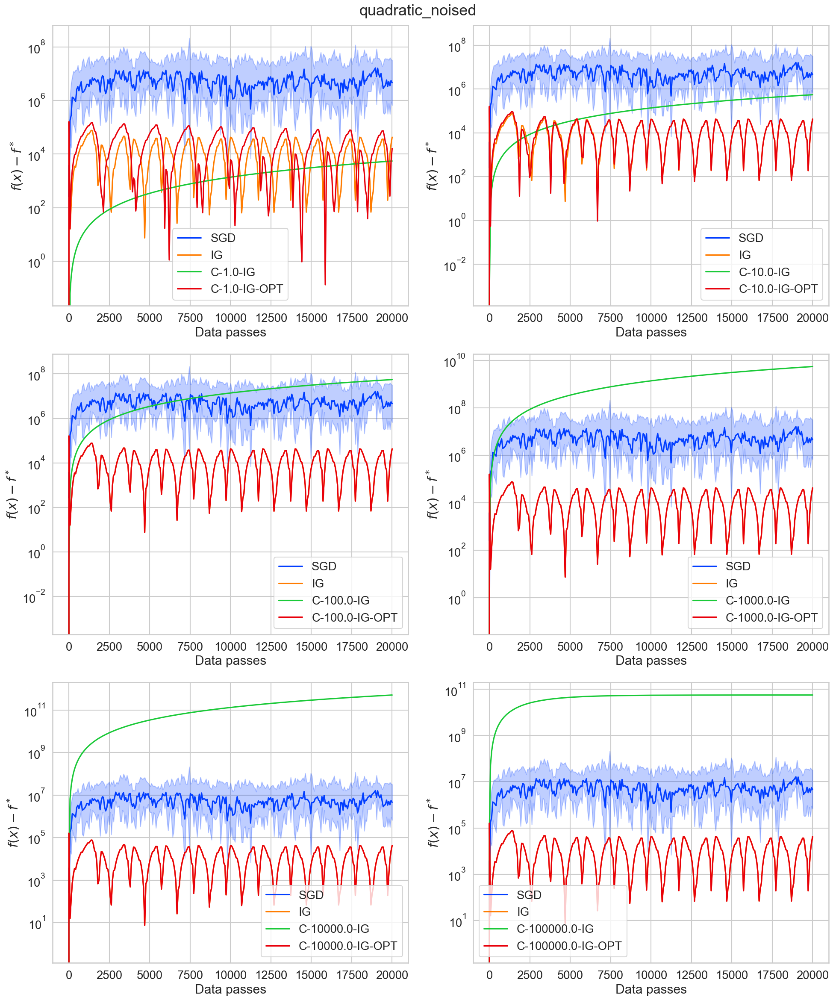

In [61]:
fig, axis = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols * 10, nrows * 8))
for ax, cig_trace, cig_opt_trace, clip_level in \
    zip(axis.flatten(), cig_traces, cig_opt_traces, clip_level_list):
    traces = [sgd_trace, ig_trace, cig_trace, cig_opt_trace]
    labels = ['SGD', 'IG', f'C-{clip_level}-IG', f'C-{clip_level}-IG-OPT']
    markers = [','] * len(labels)
    for trace, label, marker in zip(traces, labels, markers):
        trace.plot_losses(f_opt=f_opt, label=label, ax=ax, marker=marker)
    ax.set_yscale('log')
    ax.legend()
    ax.set_xlabel('Data passes')
fig.suptitle(dataset)
fig.tight_layout()
plt.savefig(os.path.join(plot_path, f'{dataset}_ig_func.png'))

#### Distance to solution

/Users/postrou/Documents/mbzuai/clipped_random_reshuffling/opt_trace.py:203: RuntimeWarning: divide by zero encountered in log
  y_log = [np.log(dist) for dist in dists]


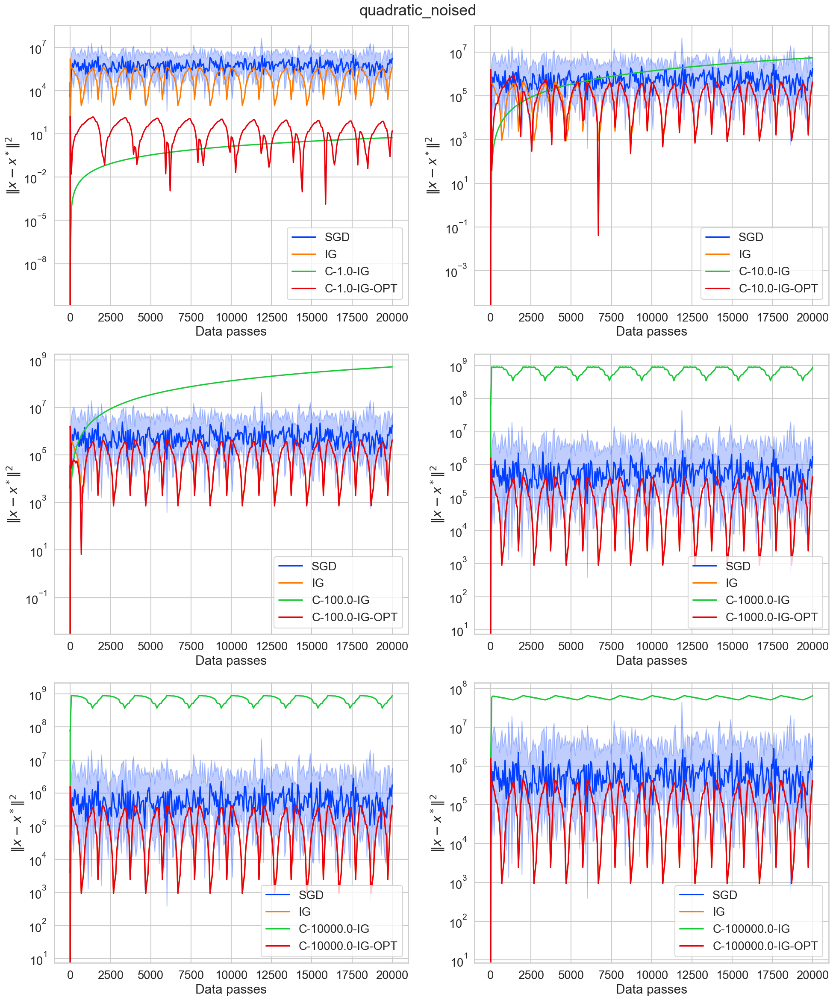

In [143]:
fig, axis = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols * 10, nrows * 8))
for ax, cig_trace, cig_opt_trace, clip_level in \
    zip(axis.flatten(), cig_traces, cig_opt_traces, clip_level_list):
    traces = [sgd_trace, ig_trace, cig_trace, cig_opt_trace]
    labels = ['SGD', 'IG', f'C-{clip_level}-IG', f'C-{clip_level}-IG-OPT']
    markers = [','] * len(labels)
    for trace, label, marker in zip(traces, labels, markers):
        trace.plot_distances(x_opt=x_opt, label=label, ax=ax, marker=marker)
    ax.set_yscale('log')
    ax.legend()
    ax.set_xlabel('Data passes')
fig.suptitle(dataset)
fig.tight_layout()
plt.savefig(os.path.join(plot_path, f'{dataset}_ig_dist.png'))

### Only CRR

#### Functional residual

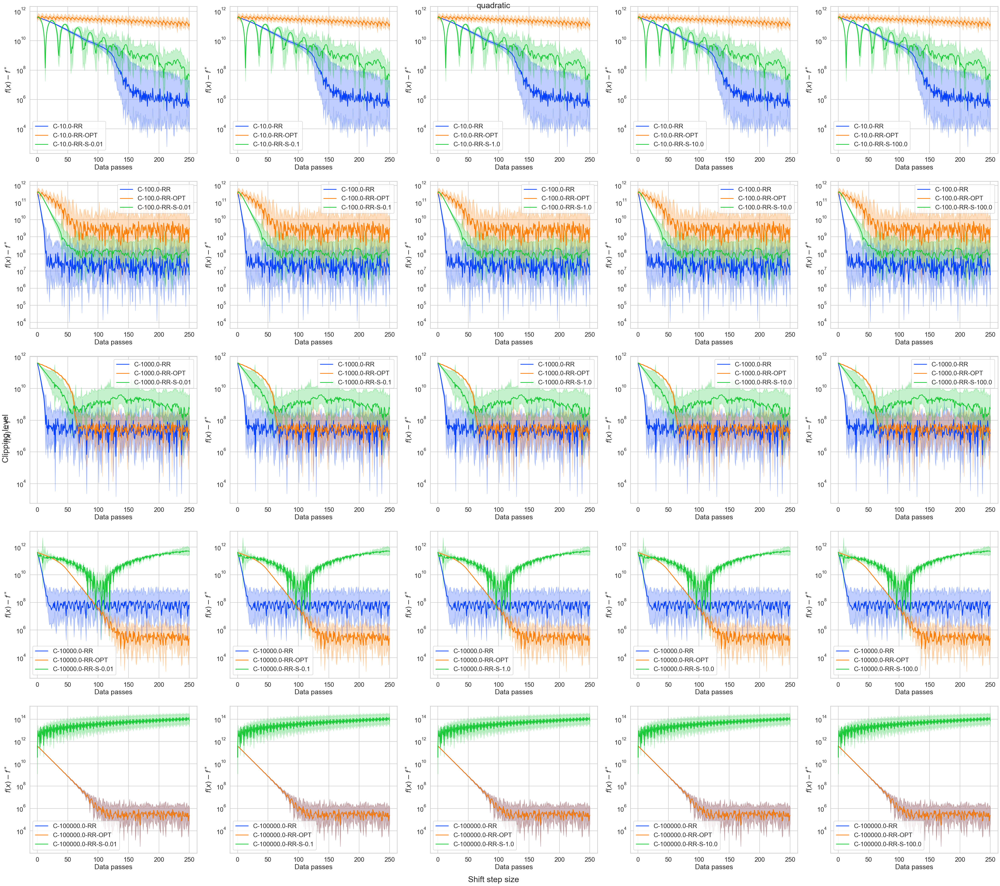

In [ ]:
nrows = len(clip_level_list)
ncols = len(alpha_shift_list)
fig, axis = plt.subplots(nrows, ncols, figsize=(ncols * 9, ncols * 8))
for i, cl in enumerate(clip_level_list):
    for j, a in enumerate(alpha_shift_list):
        ax = axis[i][j]
        cig_trace, cig_opt_trace = crr_traces[i], crr_opt_traces[i]
        alpha_shift_trace = a_crr_shift_traces_dict[alpha_shift][i]
        cig_trace.plot_losses(f_opt=f_opt, label=f'C-{cl}-RR', ax=ax)
        cig_opt_trace.plot_losses(f_opt=f_opt, label=f'C-{cl}-RR-OPT', ax=ax)
        alpha_shift_trace.plot_losses(f_opt=f_opt, label=f'C-{cl}-RR-S-{a}', ax=ax)

        ax.set_yscale('log')
        ax.legend()
        ax.set_xlabel('Data passes')
fig.suptitle(dataset)
fig.supylabel('Clipping level')
fig.supxlabel('Shift step size')
fig.tight_layout()
plt.savefig(f'./plots/{dataset}/{dataset}_func_rr_opt_shift.png', dpi=300)

#### Distance to solution

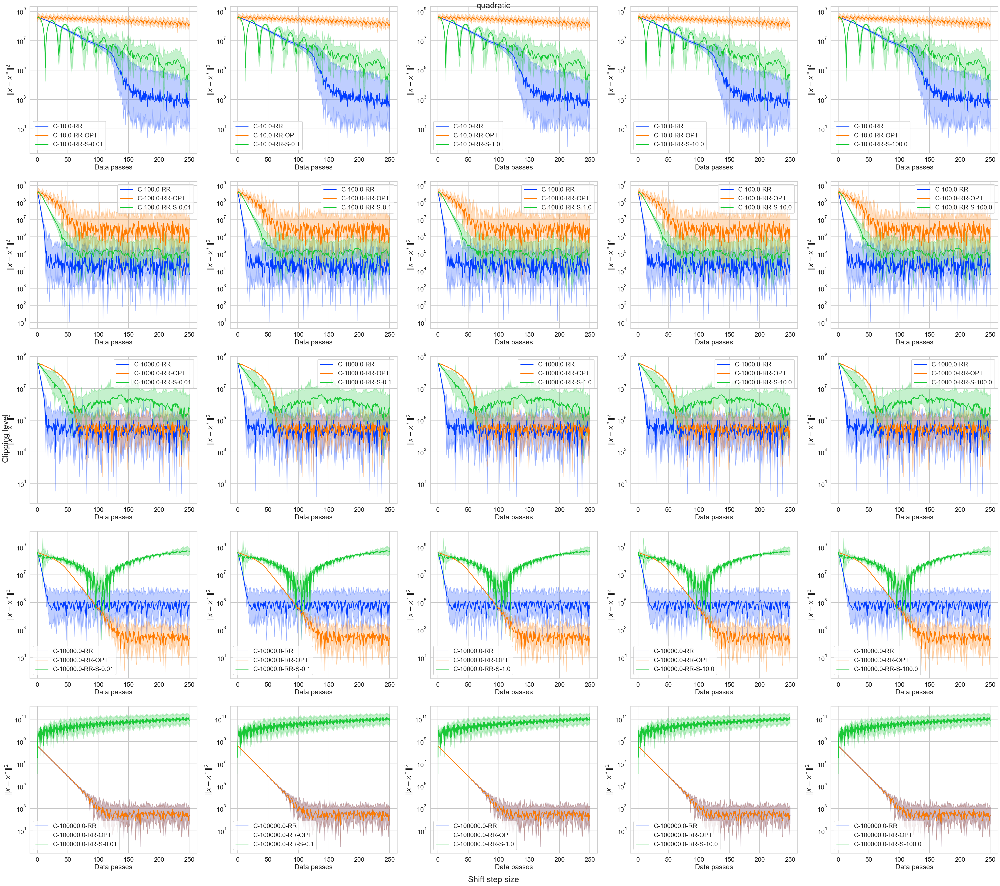

In [ ]:
nrows = len(clip_level_list)
ncols = len(alpha_shift_list)
fig, axis = plt.subplots(nrows, ncols, figsize=(ncols * 9, ncols * 8))
for i, cl in enumerate(clip_level_list):
    for j, a in enumerate(alpha_shift_list):
        ax = axis[i][j]
        cig_trace, cig_opt_trace = crr_traces[i], crr_opt_traces[i]
        alpha_shift_trace = a_crr_shift_traces_dict[alpha_shift][i]
        cig_trace.plot_distances(x_opt=x_opt, label=f'C-{cl}-RR', ax=ax)
        cig_opt_trace.plot_distances(x_opt=x_opt, label=f'C-{cl}-RR-OPT', ax=ax)
        alpha_shift_trace.plot_distances(x_opt=x_opt, label=f'C-{cl}-RR-S-{a}', ax=ax)

        ax.set_yscale('log')
        ax.legend()
        ax.set_xlabel('Data passes')
fig.suptitle(dataset)
fig.supylabel('Clipping level')
fig.supxlabel('Shift step size')
fig.tight_layout()
plt.savefig(f'./plots/{dataset}/{dataset}_dist_rr_opt_shift.png', dpi=300)

### New opt

#### Functional residual

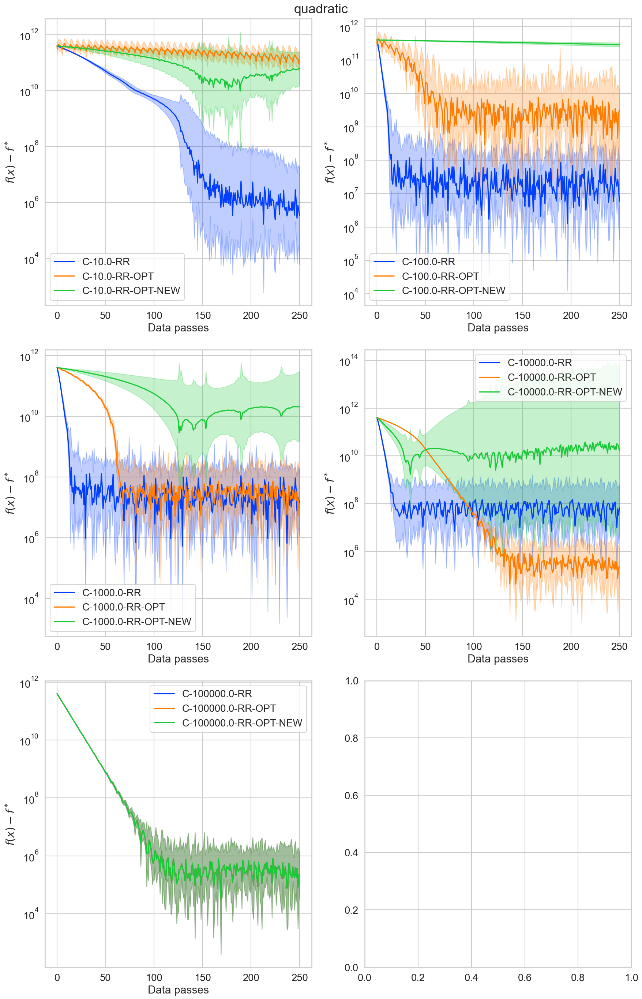

In [ ]:
fig, axis = plt.subplots(nrows=nrows, ncols=ncols, figsize=(fig_x, fig_y))
for ax, cig_trace, cig_opt_trace, crr_opt_new_trace, clip_level in \
    zip(axis.flatten(), crr_traces, crr_opt_traces, crr_opt_new_traces, clip_level_list):
    traces = [cig_trace, cig_opt_trace, crr_opt_new_trace]
    labels = [f'C-{clip_level}-RR', f'C-{clip_level}-RR-OPT', f'C-{clip_level}-RR-OPT-NEW']
    markers = [',', ',', ',']
    for trace, label, marker in zip(traces, labels, markers):
        trace.plot_losses(f_opt=f_opt, label=label, ax=ax, marker=marker)
    ax.set_yscale('log')
    ax.legend()
    ax.set_xlabel('Data passes')
fig.suptitle(dataset)
fig.tight_layout()
# plt.savefig(f'./plots/{dataset}/{dataset}/_func.png', dpi=300)

In [ ]:
clip_level_list

array([1.e+01, 1.e+02, 1.e+03, 1.e+04, 1.e+05])

#### Distance to solution

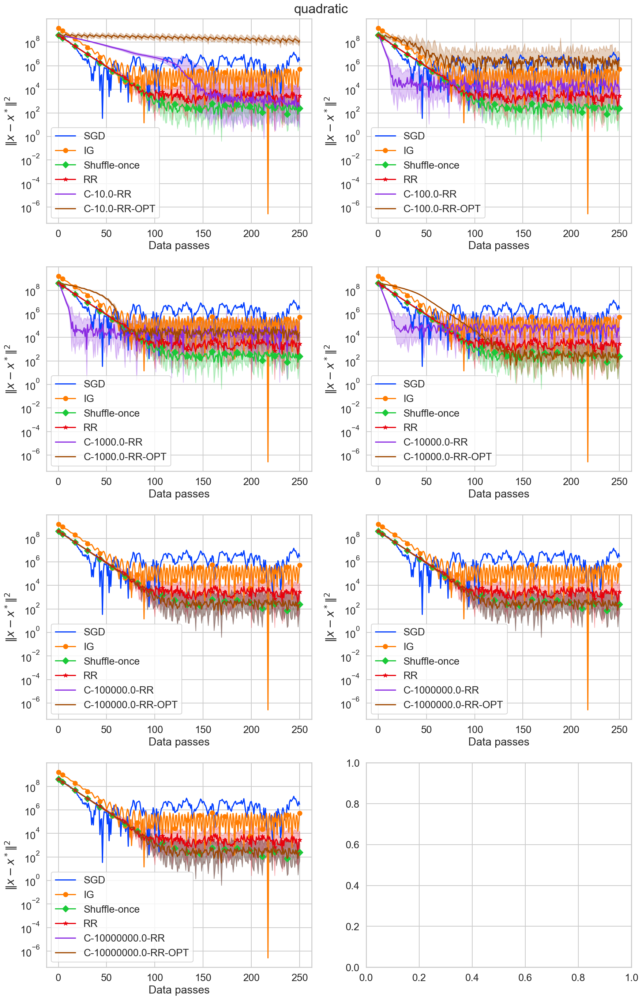

In [ ]:
fig, axis = plt.subplots(nrows=nrows, ncols=ncols, figsize=(fig_x, fig_y))
for ax, cig_trace, cig_opt_trace, clip_level in zip(axis.flatten(), crr_traces, crr_opt_traces, clip_level_list):
    traces = [sgd_trace, ig_trace, so_trace, rr_trace, cig_trace, cig_opt_trace]
    labels = ['SGD', 'IG', 'Shuffle-once', 'RR', f'C-{clip_level}-RR', f'C-{clip_level}-RR-OPT']
    markers = [',', 'o', 'D', '*', ',', ',']
    for trace, label, marker in zip(traces, labels, markers):
        trace.plot_distances(x_opt=x_opt, label=label, ax=ax, marker=marker)
    ax.set_yscale('log')
    ax.legend()
    ax.set_xlabel('Data passes')
fig.suptitle(dataset)
fig.tight_layout()
# plt.savefig(f'./plots/{dataset}/{dataset}_dist.png', dpi=300)